# Advancing Driver-Assistance Systems with Deep Learning: Object Detection in the Thermal Domain

Accompanying example notebook
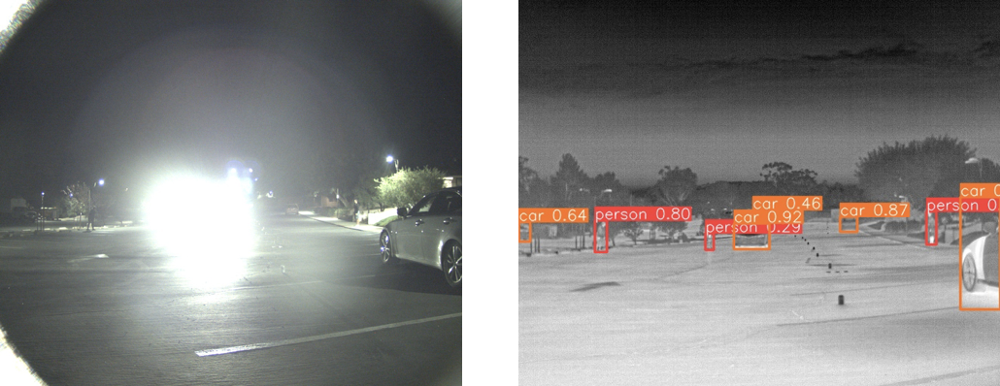

### *by John Ringrose*

## Note: this note book is a sample of the models run and analysis. The exhaustive hyper-parameter testing model training and testing to find optimal conditions is not included for obvious reasons.



---



# Section1: Exploratory Data analysis - thermal V RGB images

Visually thermal images look differnt from RGB images, however how do they look when put through some convolutions. Lets run the analysis the same images (approx) on thermal and RGB

First lets access our data set.

##### The following section can be ran on standard CPU.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
%cd MyDrive/yolo/data/thermal/EDA_image/
%ls

/gdrive/MyDrive/yolo/data/thermal/EDA_image
video-2MbnnGTv27EBLGqiQ-frame-005700-EY9ZmboXW2d8Jsrec.jpg
video-HtzkbLALFJnybfbYs-frame-000690-SbuPwvknv6yE83kWQ.jpg
video-joqMwikp57HcKZ9ai-frame-000245-cPqvLWFjkkoJH8iim.jpg


## Building a mini convolution layer in pytorch.[1]

In [ ]:
from matplotlib import pyplot as plt
import cv2

### 1.Define and visualize the filters
here we are going to build a simple horizontal edge detector.

Filter shape is:  (4, 4)


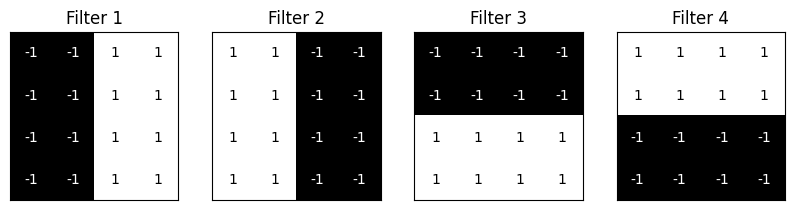

In [ ]:
import numpy as np


filter_vals = np.array([[-1, -1, 1, 1],
 [-1, -1, 1, 1],
  [-1, -1, 1, 1],
   [-1, -1, 1, 1]])

print('Filter shape is: ', filter_vals.shape)
# Defining four different filters,
# all of which are linear combinations of the `filter_vals` defined above

# define four filters
filter_1 = filter_vals
filter_2 = -filter_1
filter_3 = filter_1.T
filter_4 = -filter_3
filters = np.array([filter_1, filter_2, filter_3, filter_4])


# visualize all four filters
fig = plt.figure(figsize=(10, 5))
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))
    width, height = filters[i].shape
    for x in range(width):
        for y in range(height):
            ax.annotate(str(filters[i][x][y]), xy=(y,x),
                        horizontalalignment='center',
                        verticalalignment='center',
                        color='white' if filters[i][x][y]<0 else 'black')

### 2. Define a convolutional layer

Initialize a single convolutional layer so that it contains all your created filters. Note that you are not training this network; you are initializing the weights in a convolutional layer so that you can visualize what happens after a forward pass through this network!

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# define a neural network with a single convolutional layer with four filters
class Net(nn.Module):

    def __init__(self, weight):
        super(Net, self).__init__()
        # initializes the weights of the convolutional layer to be the weights of the 4 defined filters
        k_height, k_width = weight.shape[2:]
        # assumes there are 4 grayscale filters
        self.conv = nn.Conv2d(1, 4, kernel_size=(k_height, k_width), bias=False)
        self.conv.weight = torch.nn.Parameter(weight)

    def forward(self, x):
        # calculates the output of a convolutional layer
        # pre- and post-activation
        conv_x = self.conv(x)
        activated_x = F.relu(conv_x)

        # returns both layers
        return conv_x, activated_x

# instantiate the model and set the weights
weight = torch.from_numpy(filters).unsqueeze(1).type(torch.FloatTensor)
model = Net(weight)


In [ ]:
# check out model
print(model)

Net(
  (conv): Conv2d(1, 4, kernel_size=(4, 4), stride=(1, 1), bias=False)
)


### 3. Visualize the output of each filter

First, we'll define a helper function, `viz_layer` that takes in a specific layer and number of filters (optional argument), and displays the output of that layer once an image has been passed through.

In [ ]:
# helper function for visualizing the output of a given layer
# default number of filters is 4
def viz_layer(layer, n_filters= 4):
    fig = plt.figure(figsize=(20, 20))

    for i in range(n_filters):
        ax = fig.add_subplot(1, n_filters, i+1, xticks=[], yticks=[])
        # grab layer outputs
        ax.imshow(np.squeeze(layer[0,i].data.numpy()), cmap='gray')
        ax.set_title('Output %s' % str(i+1))

### 4. Examine some images 😀


> first image will be a thermal image of the bike class.


> next bike class image in RGB





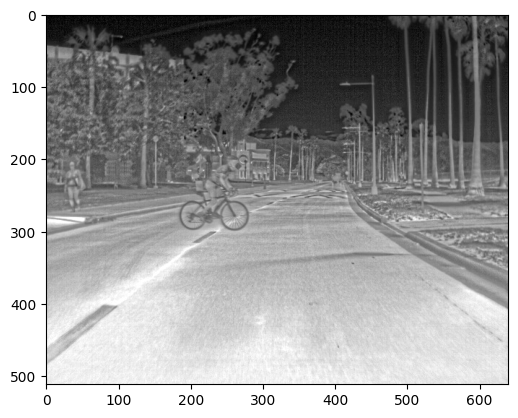

In [ ]:
# first lets load up an image.
Thermal_bike = cv2.imread('video-2MbnnGTv27EBLGqiQ-frame-005700-EY9ZmboXW2d8Jsrec.jpg')#2)
gray_img = cv2.cvtColor(Thermal_bike, cv2.COLOR_BGR2GRAY)

# normalize, rescale entries to lie in [0,1]
gray_img = gray_img.astype("float32")/255

# plot image
plt.imshow(gray_img, cmap='gray')
plt.show()

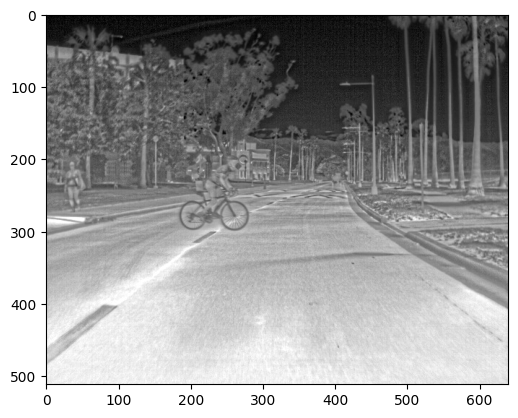

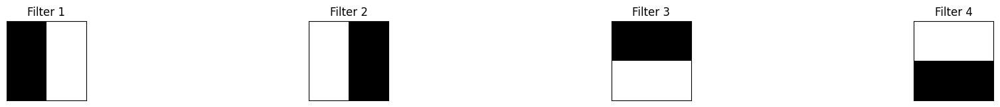

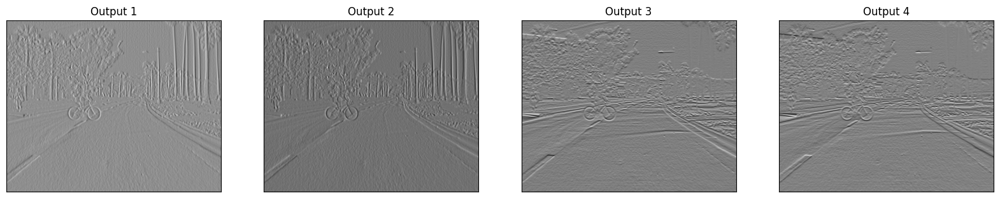

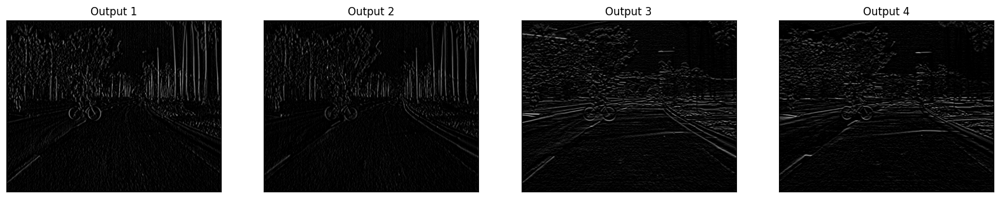

In [ ]:
# plot original image
plt.imshow(gray_img, cmap='gray')

# visualize all filters
fig = plt.figure(figsize=(12, 6))
fig.subplots_adjust(left=0, right=1.5, bottom=0.8, top=1, hspace=0.05, wspace=0.05)
for i in range(4):
    ax = fig.add_subplot(1, 4, i+1, xticks=[], yticks=[])
    ax.imshow(filters[i], cmap='gray')
    ax.set_title('Filter %s' % str(i+1))


# convert the image into an input Tensor
gray_img_tensor = torch.from_numpy(gray_img).unsqueeze(0).unsqueeze(1)

# get the convolutional layer (pre and post activation)
conv_layer, activated_layer = model(gray_img_tensor)

# visualize the output of a conv layer
viz_layer(conv_layer)
# visualize the output of an activated conv layer
viz_layer(activated_layer)

In [ ]:
%cd MyDrive/yolo/data/thermal/images/

[Errno 2] No such file or directory: 'MyDrive/yolo/data/thermal/images/'
/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


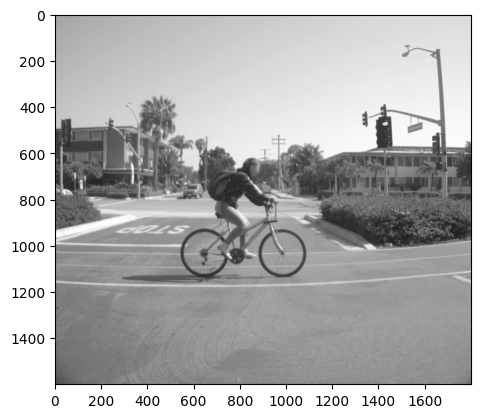

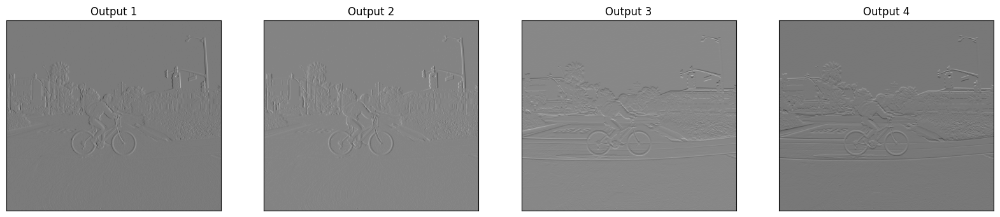

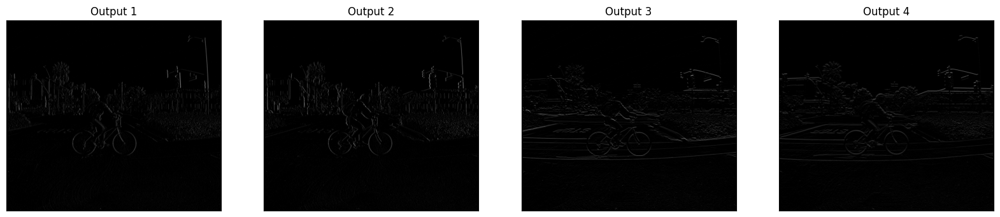

In [ ]:
RGB_bike = cv2.imread('video-joqMwikp57HcKZ9ai-frame-000245-cPqvLWFjkkoJH8iim.jpg')#2)
gray_img = cv2.cvtColor(RGB_bike, cv2.COLOR_BGR2GRAY)

# normalize, rescale entries to lie in [0,1]
gray_img = gray_img.astype("float32")/255

# plot image
plt.imshow(gray_img, cmap='gray')
plt.show()

# convert the image into an input Tensor
gray_img_tensor = torch.from_numpy(gray_img).unsqueeze(0).unsqueeze(1)

# get the convolutional layer (pre and post activation)
conv_layer, activated_layer = model(gray_img_tensor)

# visualize the output of a conv layer
viz_layer(conv_layer)
# visualize the output of an activated conv layer
viz_layer(activated_layer)

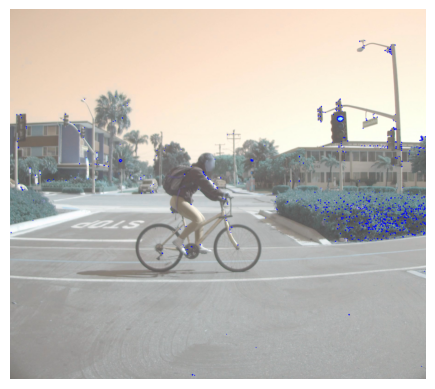

In [ ]:

dst = cv2.cornerHarris(gray_img,2,3,0.04)
#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
RGB_bike[dst>0.01*dst.max()]=[0,0,255]
#cv2.imshow('dst',img)
plt.imshow(RGB_bike)

plt.axis("off")
plt.show()
#if cv2.waitKey(0) & 0xff == 27:
 #cv2.destroyAllWindows()

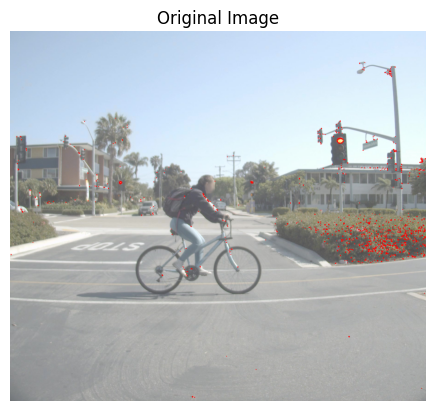

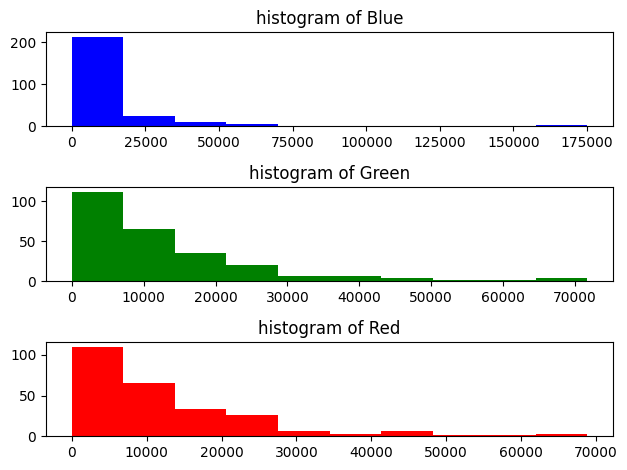

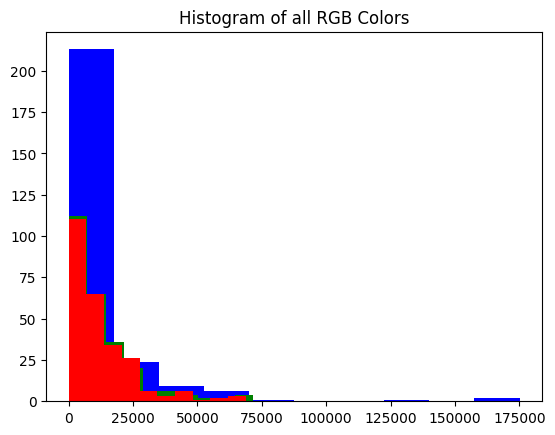

In [ ]:
# import necessary packages
import cv2
import matplotlib.pyplot as plt

# load image
imageObj = RGB_bike
# to avoid grid lines
plt.axis("off")
plt.title("Original Image")
plt.imshow(cv2.cvtColor(imageObj, cv2.COLOR_BGR2RGB))
plt.show()

# Get RGB data from image
blue_color = cv2.calcHist([imageObj], [0], None, [256], [0, 256])
red_color = cv2.calcHist([imageObj], [1], None, [256], [0, 256])
green_color = cv2.calcHist([imageObj], [2], None, [256], [0, 256])

# Separate Histograms for each color
plt.subplot(3, 1, 1)
plt.title("histogram of Blue")
plt.hist(blue_color, color="blue")

plt.subplot(3, 1, 2)
plt.title("histogram of Green")
plt.hist(green_color, color="green")

plt.subplot(3, 1, 3)
plt.title("histogram of Red")
plt.hist(red_color, color="red")

# for clear view
plt.tight_layout()
plt.show()

# combined histogram
plt.title("Histogram of all RGB Colors")
plt.hist(blue_color, color="blue")
plt.hist(green_color, color="green")
plt.hist(red_color, color="red")
plt.show()

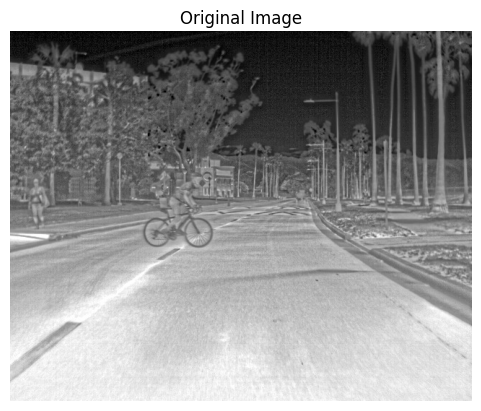

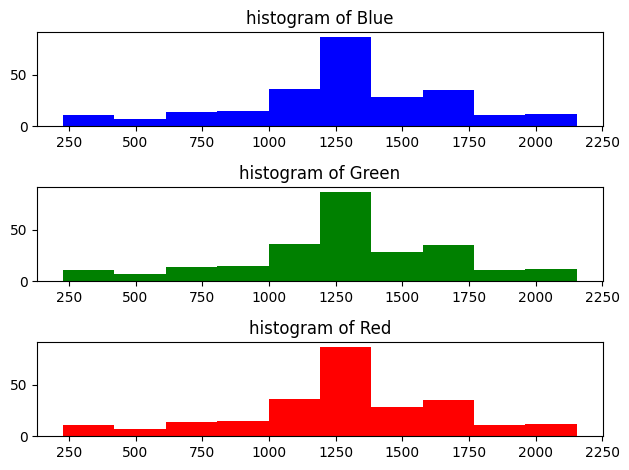

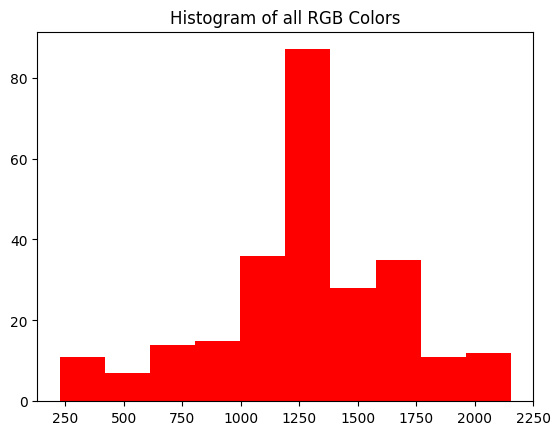

In [ ]:
# import necessary packages
import cv2
import matplotlib.pyplot as plt

# load image
imageObj = Thermal_bike
# to avoid grid lines
plt.axis("off")
plt.title("Original Image")
plt.imshow(cv2.cvtColor(imageObj, cv2.COLOR_BGR2RGB))
plt.show()

# Get RGB data from image
blue_color = cv2.calcHist([imageObj], [0], None, [256], [0, 256])
red_color = cv2.calcHist([imageObj], [1], None, [256], [0, 256])
green_color = cv2.calcHist([imageObj], [2], None, [256], [0, 256])

# Separate Histograms for each color
plt.subplot(3, 1, 1)
plt.title("histogram of Blue")
plt.hist(blue_color, color="blue")

plt.subplot(3, 1, 2)
plt.title("histogram of Green")
plt.hist(green_color, color="green")

plt.subplot(3, 1, 3)
plt.title("histogram of Red")
plt.hist(red_color, color="red")

# for clear view
plt.tight_layout()
plt.show()

# combined histogram
plt.title("Histogram of all RGB Colors")
plt.hist(blue_color, color="blue")
plt.hist(green_color, color="green")
plt.hist(red_color, color="red")
plt.show()

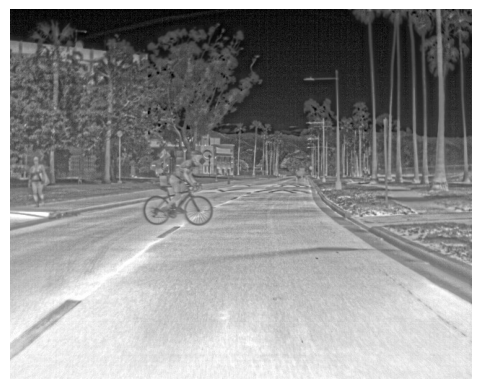

In [ ]:
plt.imshow(Thermal_bike)
plt.axis("off")
plt.show()

# Dataset:Teledyne FLIR Thermal Dataset for Algorithm Training

This free Teledyne FLIR ADAS Dataset provides fully annotated thermal and visible spectrum frames for the development of object detection systems using convolutional neural networks (CNNs). This data was constructed to encourage research on visible + thermal sensor fusion algorithms ("RGBT") and to empower the automotive community to create safer and more efficient ADAS and driverless vehicle systems.

### can be found here: https://www.flir.eu/oem/adas/adas-dataset-form/





# Section 2: Inferencing using a pre-trained YOLOv8 object detector.

##### Switch to a GPU in this case an Nvidia Tesla T4.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
%cd MyDrive/yolo/data/thermal/images/train_thermal_images/

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
!nvidia-smi

Mon Aug 14 14:37:53 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
# Pip install (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()
!yolo mode=checks

WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/166.8 GB disk)


In [ ]:
from ultralytics import YOLO
from ultralytics import NAS
from ultralytics import RTDETR


from IPython.display import display, Image


 use the cli

object detect,

validation mode its the equilivent of test, there is no test mode

use a pre-trained model yolv8 small

location of the yaml file which contains dataset set up meta

In [ ]:
!yolo task=detect mode=val model='yolov8s.pt' data=/gdrive/MyDrive/yolo/data/thermal2.yaml

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11156544 parameters, 0 gradients
100% 755k/755k [00:00<00:00, 21.8MB/s]
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/val_thermal_images.cache... 1144 images, 48 backgrounds, 0 corrupt: 100% 1144/1144 [00:00<?, ?it/s]
val: WARNING ⚠️ /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 72/72 [00:38<00:00,  1.86it/s]
                   all       1144      11607      0.687      0.405      0.471      0.289
                person       1144       4309      0.673      0.411      0.462      0.256
               bicycle       1144        170      0.626      0.275      0.322      0.195
                   car       1144       7128      0.762      0.529      0.628      0.417
Spe

In [ ]:
%cd /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images/
#%ls

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
!yolo task=detect mode=predict model='yolov8s.pt' conf=0.25 source='video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg'


Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11156544 parameters, 0 gradients

image 1/1 /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images/video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg: 512x640 9 persons, 3 cars, 1 truck, 105.6ms
Speed: 2.2ms preprocess, 105.6ms inference, 2.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict11


/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


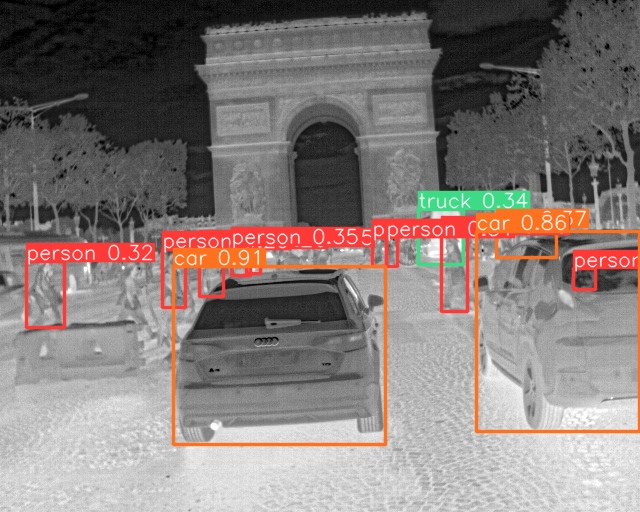

In [ ]:

%cd /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images/
Image(filename='runs/detect/predict11/video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg')

In [ ]:
!yolo task=segment mode=predict model='yolov8s-seg.pt' conf=0.25 source='video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg'


100% 22.8M/22.8M [00:00<00:00, 81.5MB/s]
Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients

image 1/1 /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images/video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg: 512x640 7 persons, 3 cars, 127.5ms
Speed: 2.1ms preprocess, 127.5ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/segment/predict3


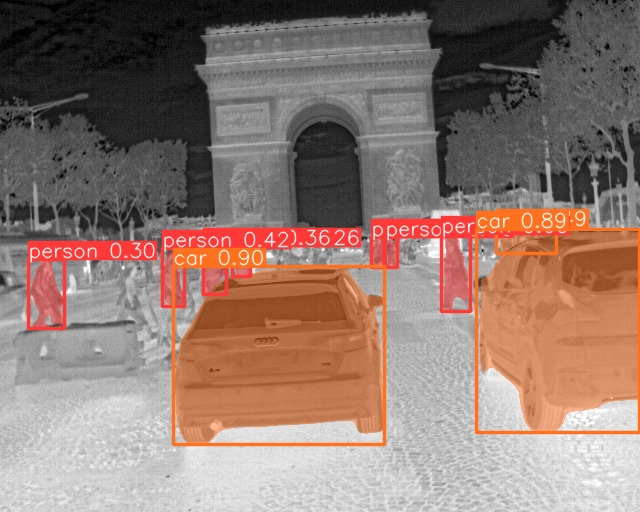

In [ ]:
Image(filename='runs/segment/predict3/video-3eAD4KjAqae5iq48L-frame-013572-Qqs9NKknhLcGQ8JqB.jpg')

## So far so good, we have taken a yolo model the S or small,

tested our dataset for accuracy.

1.tested our dataset for accuracy.

2.predicted on a single image.

3.used a varient of the model to segement the image.

### the mAP(50) for the car class was 0.628 not great.
lets scale up the model and check the result.

also Speed: 1.1ms preprocess, **7.2ms inference**, 0.0ms loss, 1.7ms postprocess per image



In [ ]:
!yolo task=detect mode=val model='yolov8x.pt' data=/gdrive/MyDrive/yolo/data/thermal2.yaml

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x summary (fused): 268 layers, 68200608 parameters, 0 gradients
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/val_thermal_images.cache... 1144 images, 48 backgrounds, 0 corrupt: 100% 1144/1144 [00:00<?, ?it/s]
val: WARNING ⚠️ /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 72/72 [01:08<00:00,  1.05it/s]
                   all       1144      11607       0.78      0.513      0.592      0.391
                person       1144       4309      0.782      0.476      0.567       0.35
               bicycle       1144        170       0.73      0.447      0.477      0.305
                   car       1144       7128      0.828      0.616      0.733      0.517
Speed: 0.6ms preprocess, 46.7ms inference,

 ## using the largest model the X we have the following

 mAP(50) for the car class is now 0.733 much better but not good enough.

 also note how the speed metrics have changed.

 Speed: 0.6ms preprocess, **46.7ms inference**, 0.0ms loss, 1.3ms postprocess per image

This model is signicicently slower, highlighting the trade off.

# Section 3: Training on our Custom data set (FLIR thermal V2) YOLOv8 object detector.


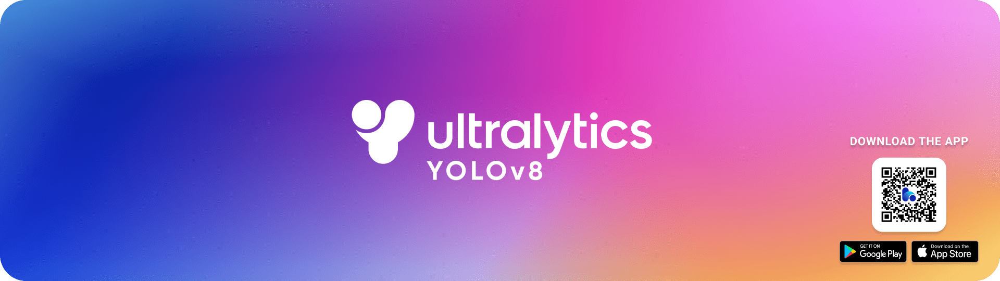

## Given this level of accuracy we need to train a model. there are two ways this can be done ( from the doc's)

##### Build a new model from YAML and start training from scratch
yolo detect train data=coco128.yaml model=yolov8n.yaml epochs=100 imgsz=640

##### Start training from a pretrained *.pt model
yolo detect train data=coco128.yaml model=yolov8n.pt epochs=100 imgsz=640

##### Build a new model from YAML, transfer pretrained weights to it and start training
yolo detect train data=coco128.yaml model=yolov8n.yaml pretrained=yolov8n.pt epochs=100 imgsz=640

##### Switch to a high performance GPU with high RAM in this case an Nvidia A100.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
%cd MyDrive/yolo/data/thermal/images/train_thermal_images/

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
!nvidia-smi

Thu Jul 27 18:49:12 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    45W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
# Pip install (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()
!yolo mode=checks

WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.143 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 24.3/166.8 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image


In [ ]:
%cd /gdrive/MyDrive/yolo/data
%ls

/gdrive/MyDrive/yolo/data
FLIR_rgb_yolov8.yaml  thermal1.yaml       thermal.yaml     yolov8-p6B.yaml
gdrive/               thermal2_aug1.yaml  YOLOv8/          yolov8-p6.yaml
rtdetr-x.pt           thermal2_rgb.yaml   yolov8l.pt       yolov8s.pt
runs/                 thermal2.yaml       yolov8m.pt       yolov8x.pt
test_v8.yaml          thermal3.yaml       yolov8n.pt
thermal/              thermal_test.yaml   yolov8-p6A.yaml


In [ ]:
model = YOLO('yolov8x.pt')  # load a partially trained model
model.train(data='thermal2.yaml',
            epochs=150,
            patience=30,
            batch=32,
            lrf=0.001,
            cos_lr=True,
            dropout=0.1,
            mosaic=0.9,
            mixup=0.9,
            copy_paste=0.6)

in a lot of cases the training run crashes due to disconnection from the drive.
When this happends it is possible to resume training by loading the last weighs and
resuming training.

In [ ]:
model = YOLO('/gdrive/MyDrive/yolo/data/runs/detect/train72/weights/last.pt')
model.train(resume= True)

Ultralytics YOLOv8.0.143 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/yolo/data/runs/detect/train72/weights/last.pt, data=thermal2.yaml, epochs=150, patience=30, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, k

## lets test the results of this model training round

*its is a good idea to switch back to a standard GPU at this point*

we open the folder with the training data/weights which in this case is train72

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train72/weights/
#%cd ..
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train72/weights
best.pt  last.pt  runs/


### to reconfirm the result on the validation set we check on the yaml file where the validation set is set up as
train: /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images  # 10742 images
val: /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images  # 1144 images
test: /gdrive/MyDrive/yolo/data/thermal/images/test_thermal_images  # 3749 images

In [ ]:
!yolo task=detect mode=val model='best.pt' data=/gdrive/MyDrive/yolo/data/thermal2.yaml

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68134161 parameters, 0 gradients
100% 755k/755k [00:00<00:00, 105MB/s]
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/val_thermal_images.cache... 1144 images, 48 backgrounds, 0 corrupt: 100% 1144/1144 [00:00<?, ?it/s]
val: WARNING ⚠️ /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 72/72 [01:30<00:00,  1.25s/it]
                   all       1144      11607      0.857      0.703      0.804      0.562
                person       1144       4309      0.897      0.693      0.849      0.555
                  bike       1144        170      0.755      0.612      0.659      0.439
                   car       1144       7128       0.92      0.805      0.905       0.69
Speed:

similar result as expected

### Test final YOLOv8x hyparameter- tuned model on test set.

Behiend the scenes we have been using the validation set to check a number of models performance to get to this the final model. At this point we need to use the acutal 'TEST' set.
To do so a new yaml file is created and the 'test' and 'val' positions changed. YOLO does not have a mode=test.
train: /gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images  # 10742 images
val: /gdrive/MyDrive/yolo/data/thermal/images/test_thermal_images  # 3749 images
test: /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images  # 1144 images


In [ ]:
!yolo task=detect mode=val model='best.pt' data=/gdrive/MyDrive/yolo/data/thermal_test.yaml

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68134161 parameters, 0 gradients
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/test_thermal_images.cache... 3749 images, 256 backgrounds, 0 corrupt: 100% 3749/3749 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 235/235 [05:06<00:00,  1.31s/it]
                   all       3749      41872       0.57      0.495      0.564      0.379
                person       3749      11242      0.854      0.717      0.842       0.55
                  bike       3749        113          0          0   0.000444   0.000265
                   car       3749      30517      0.856      0.768      0.849      0.588
Speed: 0.2ms preprocess, 54.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val4


Note the drop in mAP(50)the test set is very challanging and quite different from the training and validation images.

### Looking in detail of the training and testing metrics.

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train72/
#%cd ..
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train72
args.yaml                                          train_batch0.jpg
confusion_matrix_normalized.png                    train_batch1.jpg
confusion_matrix.png                               train_batch2.jpg
events.out.tfevents.1690454458.fd1539c1dcdb.247.0  train_batch75180.jpg
events.out.tfevents.1690469038.d6aa5e445d34.274.0  train_batch75181.jpg
events.out.tfevents.1690483861.f7571a8c2603.557.0  train_batch75182.jpg
F1_curve.png                                       val_batch0_labels.jpg
labels_correlogram.jpg                             val_batch0_pred.jpg
labels.jpg                                         val_batch1_labels.jpg
P_curve.png                                        val_batch1_pred.jpg
PR_curve.png                                       val_batch2_labels.jpg
R_curve.png                                        val_batch2_pred.jpg
results.csv                                        weights/
results.png


In [ ]:
import pandas as pd
results =pd.read_csv('results.csv')
results


,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,1.25890,1.12530,1.07360,0.77533,0.60271,0.69380,0.45179,0.95088,0.58297,0.93434,0.003327,0.003327,0.003327
1,1,1.20550,0.79402,1.03630,0.76846,0.59482,0.69961,0.45625,0.96043,0.60294,0.93987,0.006616,0.006616,0.006616
2,2,1.27410,0.84673,1.06400,0.72760,0.52055,0.59531,0.35825,1.11470,0.81016,1.00500,0.009861,0.009861,0.009861
3,3,1.32990,0.89317,1.09350,0.78514,0.57875,0.65259,0.41104,1.04840,0.67051,0.98402,0.009800,0.009800,0.009800
4,4,1.28610,0.83819,1.07490,0.73509,0.60735,0.67038,0.42239,1.01640,0.62658,0.96834,0.009800,0.009800,0.009800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,145,0.73770,0.35190,0.85785,0.83287,0.71790,0.80265,0.56206,0.84679,0.43338,0.91161,0.000410,0.000410,0.000410
146,146,0.73377,0.34799,0.85631,0.84296,0.71234,0.80271,0.56206,0.84685,0.43326,0.91164,0.000343,0.000343,0.000343
147,147,0.73148,0.34616,0.85662,0.84528,0.71099,0.80252,0.56112,0.84712,0.43353,0.91170,0.000276,0.000276,0.000276
148,148,0.72480,0.34283,0.85487,0.84334,0.71246,0.80279,0.56105,0.84738,0.43397,0.91187,0.000210,0.000210,0.000210


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(results, *['                  epoch'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(results, *['         train/box_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(results, *['         train/cls_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(results, *['         train/dfl_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(results, *['                  epoch'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(results, *['         train/box_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(results, *['         train/cls_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(results, *['         train/dfl_loss'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 10 * figscale, 10 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(results, *[[['                  epoch', '         train/box_loss'], ['         train/box_loss', '         train/cls_loss'], ['         train/cls_loss', '         train/dfl_loss'], ['         train/dfl_loss', '   metrics/precision(B)']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(results, *['                  epoch', '         train/box_loss', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(results, *['                  epoch', '         train/cls_loss', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(results, *['                  epoch', '         train/dfl_loss', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(results, *['                  epoch', '   metrics/precision(B)', None], **{})
chart

Text(0.5, 0, 'epoch')

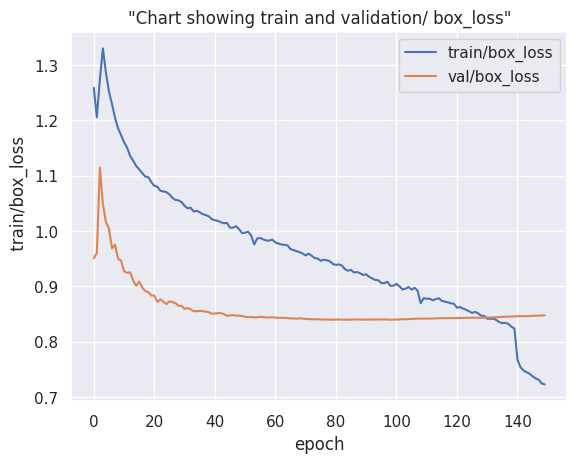

In [ ]:
import seaborn as sns
sns.lineplot( data=results['         train/box_loss'],label='train/box_loss')
sns.lineplot( data=results['           val/box_loss'],label ='val/box_loss')
plt.title('"Chart showing train and validation/ box_loss"')
plt.legend()
plt.xlabel('epoch')



Text(0.5, 0, 'epoch')

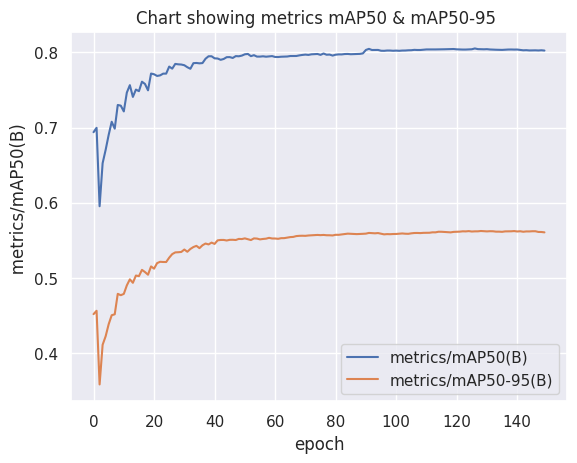

In [ ]:
sns.lineplot( data=results['       metrics/mAP50(B)'],label ='metrics/mAP50(B)')
sns.lineplot( data=results['    metrics/mAP50-95(B)'],label='metrics/mAP50-95(B)')
plt.title("Chart showing metrics mAP50 & mAP50-95 ")
plt.legend()
plt.xlabel('epoch')


Text(0.5, 0, 'epoch')

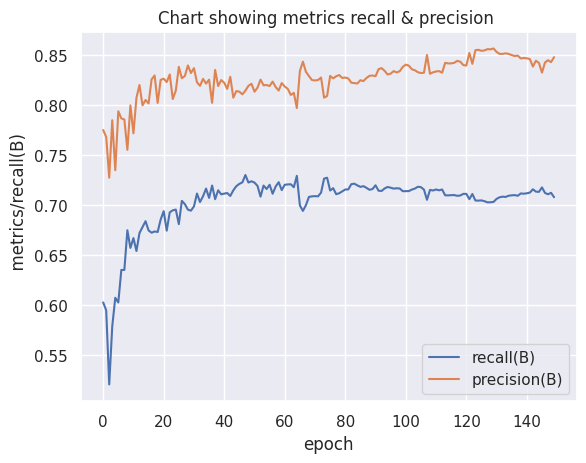

In [ ]:

sns.lineplot( data=results['      metrics/recall(B)'],label ='recall(B)')
sns.lineplot( data=results['   metrics/precision(B)'],label ='precision(B)')
plt.title("Chart showing metrics recall & precision ")
plt.legend()
plt.xlabel('epoch')


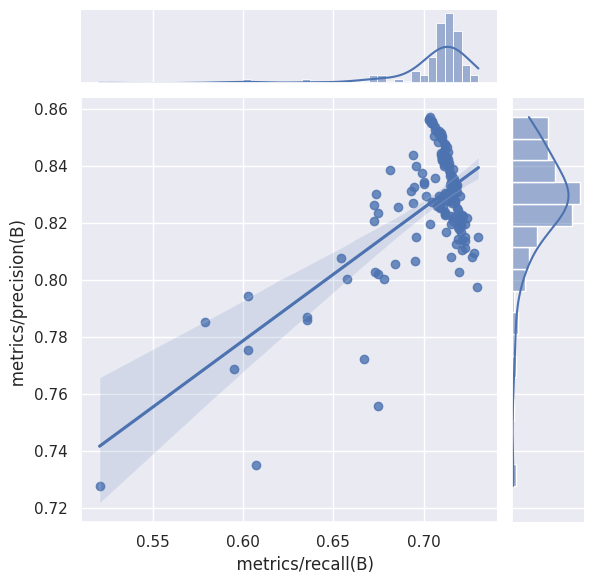

In [ ]:
sns.set_theme()

sns.jointplot(x="      metrics/recall(B)", y="   metrics/precision(B)", data=results, kind="reg");



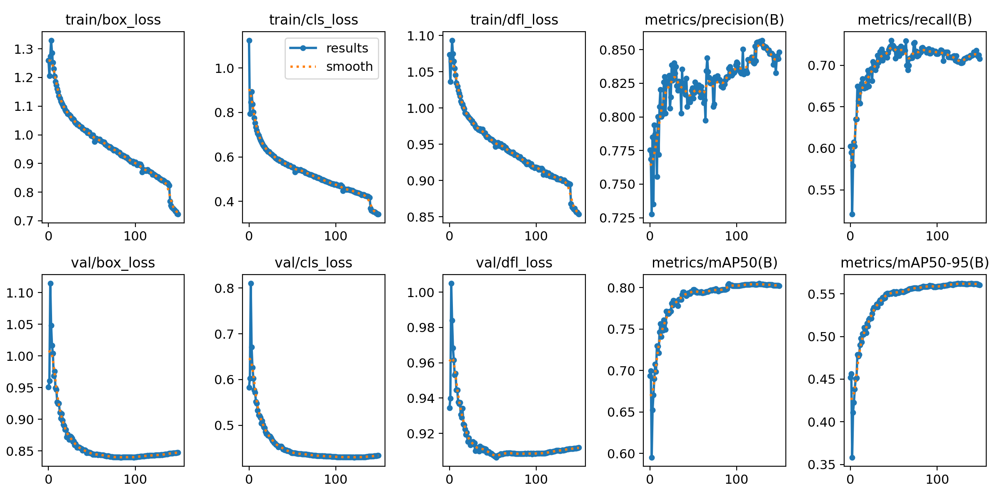

In [ ]:
Image(filename=f'results.png', width=1000)

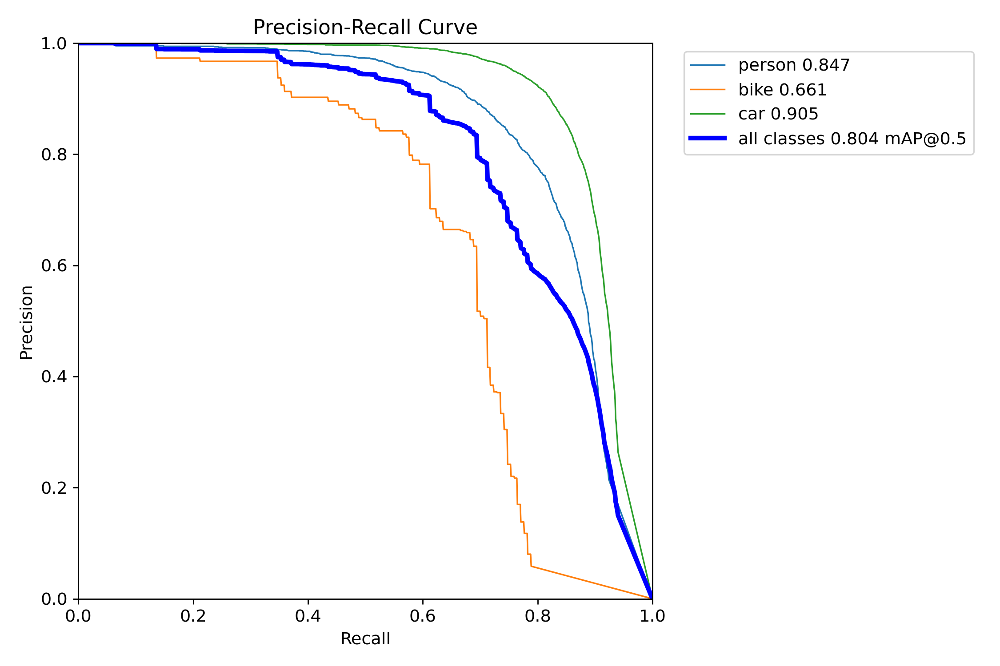

In [ ]:
Image(filename=f'PR_curve.png', width=400)


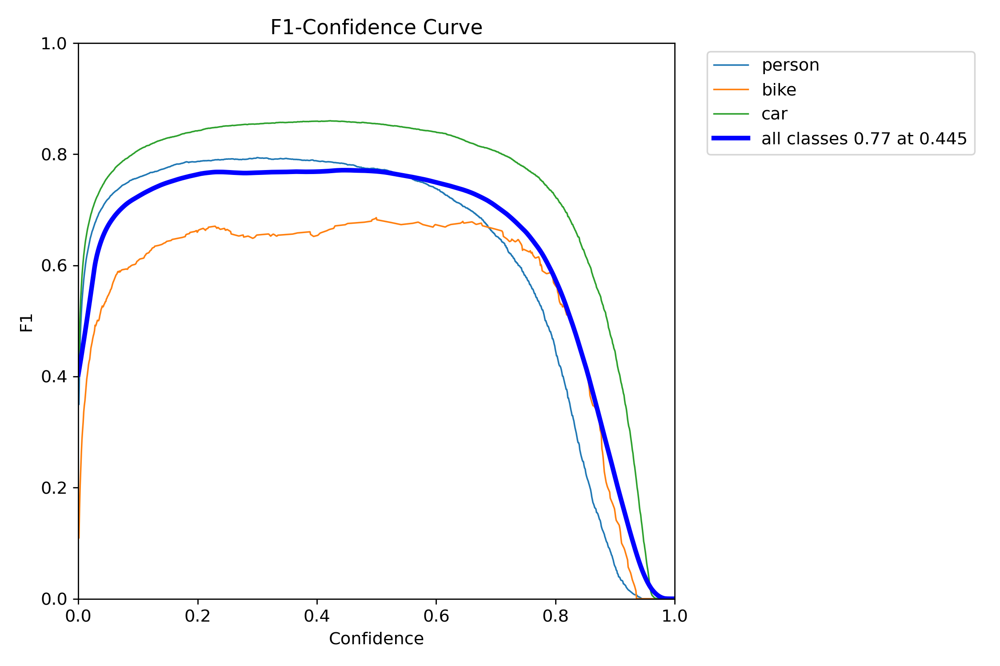

In [ ]:
Image(filename=f'F1_curve.png', width=400)

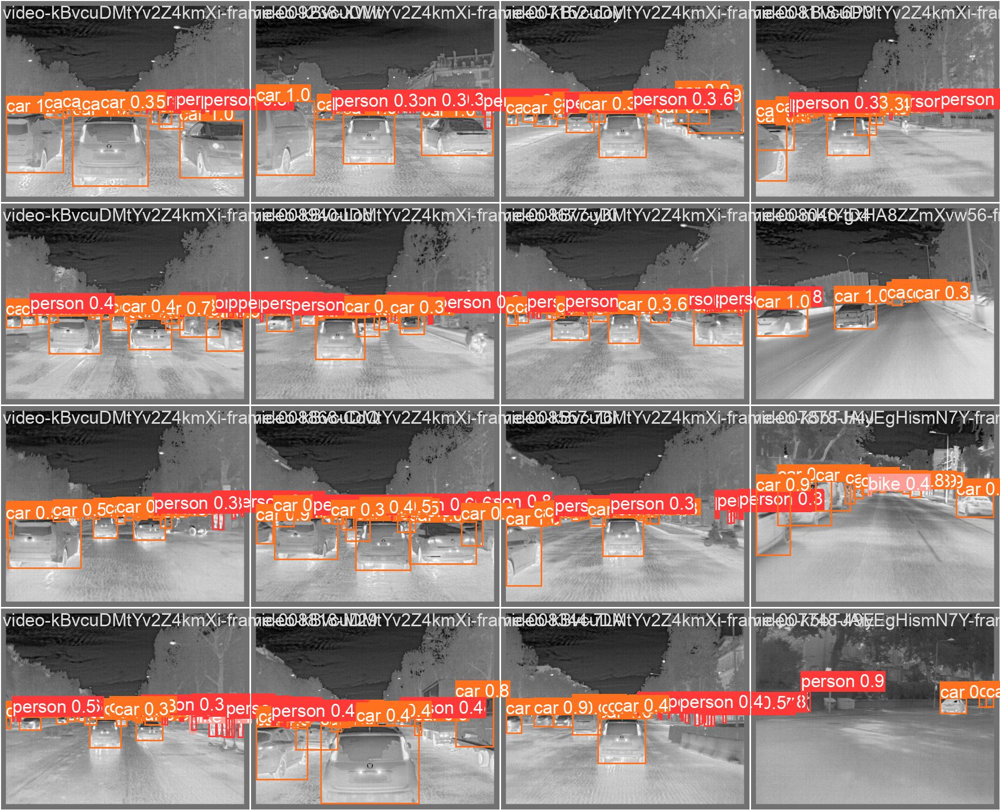

In [ ]:
Image(filename=f'val_batch2_pred.jpg', width=1000)

Some reasonably good results. This is an example of the number of models trained, the best model ID60 had a mAP for car class of 90.6

# Custom model
Having used a base architecture, would a custom model perform better. For a full discussion see doc's
Here we are swaping out the C2f module for the C3.
Notice there are additional C3 modules scaling from 9 to 3 in the convoluton blocks.

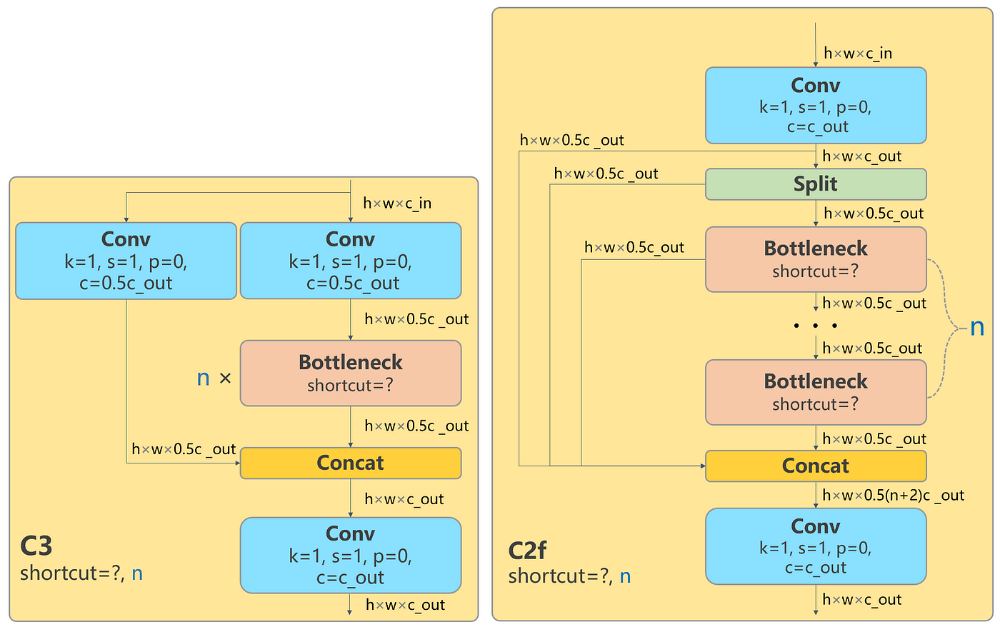

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
%cd MyDrive/yolo/data/thermal/images/train_thermal_images/

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/gdrive/MyDrive/yolo/data/thermal/images/train_thermal_images


In [ ]:
# Pip install (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()
!yolo mode=checks

WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 26.3/166.8 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image


In [ ]:
%cd /gdrive/MyDrive/yolo/data
%ls

/gdrive/MyDrive/yolo/data
FLIR_rgb_yolov8.yaml  thermal1.yaml       thermal.yaml     yolov8-p6A.yaml
gdrive/               thermal2_aug1.yaml  YOLOv8/          yolov8-p6B.yaml
rtdetr-x.pt           thermal2_rgb.yaml   yolov8-IR2.yaml  yolov8-p6TR.yaml
runs/                 thermal2.yaml       yolov8l.pt       yolov8-p6.yaml
test_v8.yaml          thermal3.yaml       yolov8m.pt       yolov8s.pt
thermal/              thermal_test.yaml   yolov8n.pt       yolov8x.pt


## reading in model from .yaml
For a custom model we create a .yaml file and read in the model from it. in this case its yolov8x-IR2 for InfraRed model2

In [ ]:
model = YOLO('/gdrive/MyDrive/yolo/data/yolov8x-IR2.yaml')
#model.train(data='coco128.yaml', epochs=5)


                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  9    630720  ultralytics.nn.modules.block.C3              [160, 160, 9, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  9   2515840  ultralytics.nn.modules.block.C3              [320, 320, 9, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6   6973440  ultralytics.nn.modules.block.C3              [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics.nn.modules.conv.Conv             [640

In [ ]:
#model = YOLO('/gdrive/MyDrive/yolo/data/runs/detect/train69/weights/best.pt')  # load a partially trained model
model.train(data='thermal2.yaml',  epochs=120, patience=30,batch=32,lrf=0.001, dropout=0.1,mosaic=0.9,mixup=0.9)


Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/yolo/data/yolov8x-IR2.yaml, data=thermal2.yaml, epochs=120, patience=30, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimi

as usual model training crashed. it was resumed to 107epochs and crashed again. Showing final 107 to 120 epochs.

In [ ]:
model = YOLO('/gdrive/MyDrive/yolo/data/runs/detect/train83/weights/last.pt')
model.train(resume= True)

Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/yolo/data/runs/detect/train83/weights/last.pt, data=thermal2.yaml, epochs=120, patience=30, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, 

#### These are good results considering this was not a transfer-learned model like the previous attempt.

### Custom model metrics

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train83/weights/
#%cd ..
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train83/weights
best.pt  last.pt


In [ ]:
!yolo task=detect mode=val model='best.pt' data=/gdrive/MyDrive/yolo/data/thermal2.yaml

Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-IR2 summary (fused): 405 layers, 84431676 parameters, 0 gradients
100% 755k/755k [00:00<00:00, 26.4MB/s]
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/val_thermal_images.cache... 1144 images, 48 backgrounds, 0 corrupt: 100% 1144/1144 [00:00<?, ?it/s]
val: WARNING ⚠️ /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 72/72 [01:29<00:00,  1.24s/it]
                   all       1144      11607      0.832      0.694      0.782      0.536
                person       1144       4309      0.885      0.684      0.831      0.531
                  bike       1144        170       0.69        0.6       0.62      0.403
                   car       1144       7128       0.92      0.797      0.896      0.674

No hyperparemter tuning was used here, except that learning from transfer- learning the yolov8_x. However we need to test using the test set ( see discussion on same for previous model.)

In [ ]:
!yolo task=detect mode=val model='best.pt' data=/gdrive/MyDrive/yolo/data/thermal_test.yaml

Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8x-IR2 summary (fused): 405 layers, 84431676 parameters, 0 gradients
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/test_thermal_images.cache... 3749 images, 256 backgrounds, 0 corrupt: 100% 3749/3749 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 235/235 [04:51<00:00,  1.24s/it]
                   all       3749      41872      0.564      0.494      0.558      0.367
                person       3749      11242      0.856      0.705      0.831      0.531
                  bike       3749        113          0          0    0.00179   0.000856
                   car       3749      30517      0.837      0.777      0.842       0.57
Speed: 0.2ms preprocess, 58.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val2


Not bad results for car and person class.
lets take a look at training details an metrics in detail.

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train83/
#%cd ..
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train83
args.yaml                                           results.png
confusion_matrix_normalized.png                     train_batch0.jpg
confusion_matrix.png                                train_batch1.jpg
events.out.tfevents.1691849530.4c2f431349be.353.0   train_batch2.jpg
events.out.tfevents.1691864007.015f0d0e864f.247.0   train_batch59070.jpg
events.out.tfevents.1691878995.71eec7c1a6cf.1164.0  train_batch59071.jpg
events.out.tfevents.1691912169.822e663e821a.5797.0  train_batch59072.jpg
F1_curve.png                                        val_batch0_labels.jpg
labels_correlogram.jpg                              val_batch0_pred.jpg
labels.jpg                                          val_batch1_labels.jpg
P_curve.png                                         val_batch1_pred.jpg
PR_curve.png                                        val_batch2_labels.jpg
R_curve.png                                         val_batch2_pred.jpg
results.csv               

In [ ]:
import pandas as pd
results =pd.read_csv('results.csv')
results


,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,4.34050,5.19450,3.97570,0.35844,0.02181,0.00882,0.00201,3.75390,4.64520,2.83940,0.003327,0.003327,0.003327
1,1,2.60180,2.34610,1.97990,0.42753,0.31210,0.32045,0.15384,1.81480,1.41210,1.46880,0.006605,0.006605,0.006605
2,2,1.96440,1.55170,1.50720,0.52820,0.40466,0.42542,0.22398,1.48900,1.10090,1.26100,0.009827,0.009827,0.009827
3,3,1.70430,1.25050,1.35020,0.62333,0.44655,0.49797,0.27120,1.35310,0.90305,1.17060,0.009750,0.009750,0.009750
4,4,1.54820,1.07990,1.25950,0.70677,0.49371,0.56314,0.32593,1.21220,0.78804,1.10290,0.009750,0.009750,0.009750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,115,0.85521,0.43747,0.90704,0.82961,0.69610,0.78207,0.53325,0.86865,0.45971,0.92564,0.000509,0.000509,0.000509
116,116,0.85446,0.43662,0.90648,0.82641,0.69510,0.78079,0.53345,0.86868,0.45980,0.92556,0.000426,0.000426,0.000426
117,117,0.85159,0.43288,0.90463,0.82849,0.69358,0.78092,0.53344,0.86825,0.45945,0.92551,0.000343,0.000343,0.000343
118,118,0.84649,0.42941,0.90186,0.82843,0.69426,0.78100,0.53410,0.86823,0.45946,0.92543,0.000260,0.000260,0.000260


Loss curves showing a typical train from scratch drop

Text(0.5, 0, 'epoch')

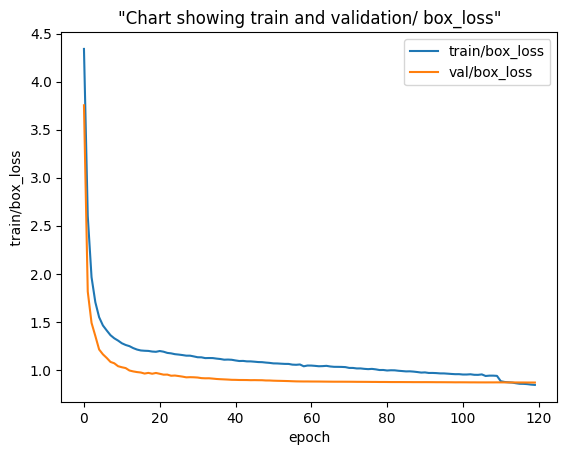

In [ ]:
import seaborn as sns
sns.lineplot( data=results['         train/box_loss'],label='train/box_loss')
sns.lineplot( data=results['           val/box_loss'],label ='val/box_loss')
plt.title('"Chart showing train and validation/ box_loss"')
plt.legend()
plt.xlabel('epoch')



Text(0.5, 0, 'epoch')

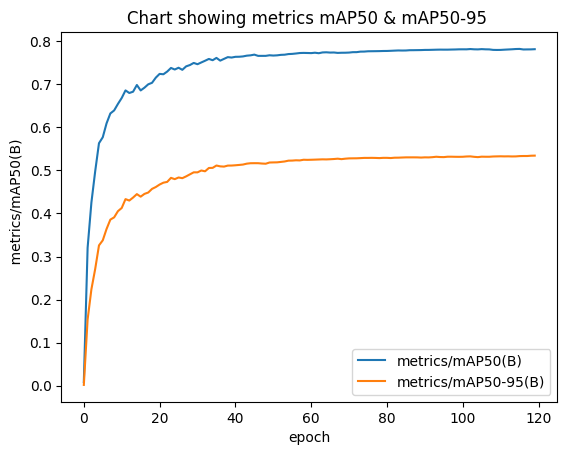

In [ ]:
sns.lineplot( data=results['       metrics/mAP50(B)'],label ='metrics/mAP50(B)')
sns.lineplot( data=results['    metrics/mAP50-95(B)'],label='metrics/mAP50-95(B)')
plt.title("Chart showing metrics mAP50 & mAP50-95 ")
plt.legend()
plt.xlabel('epoch')


Text(0.5, 0, 'epoch')

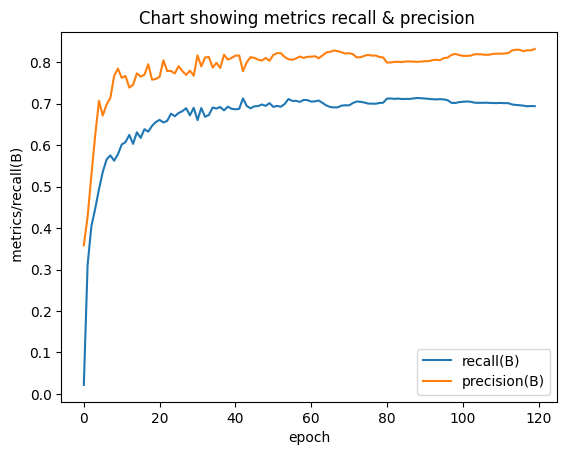

In [ ]:

sns.lineplot( data=results['      metrics/recall(B)'],label ='recall(B)')
sns.lineplot( data=results['   metrics/precision(B)'],label ='precision(B)')
plt.title("Chart showing metrics recall & precision ")
plt.legend()
plt.xlabel('epoch')


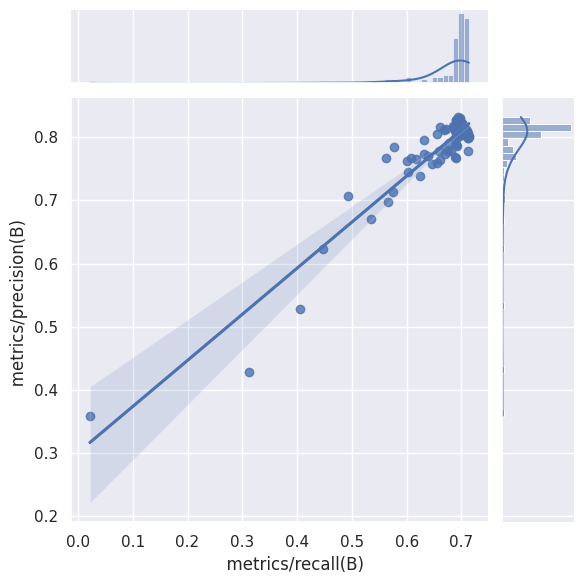

In [ ]:
sns.set_theme()

sns.jointplot(x="      metrics/recall(B)", y="   metrics/precision(B)", data=results, kind="reg");



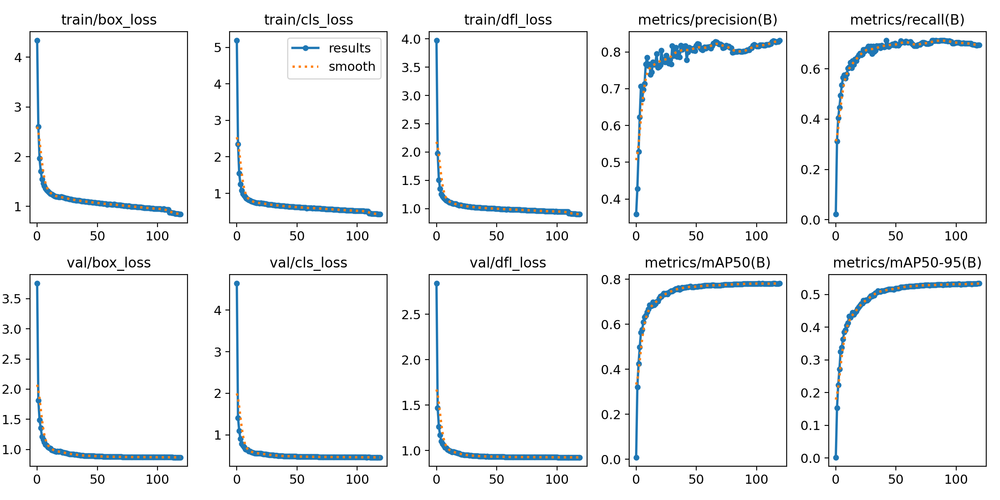

In [ ]:
Image(filename=f'results.png', width=1000)

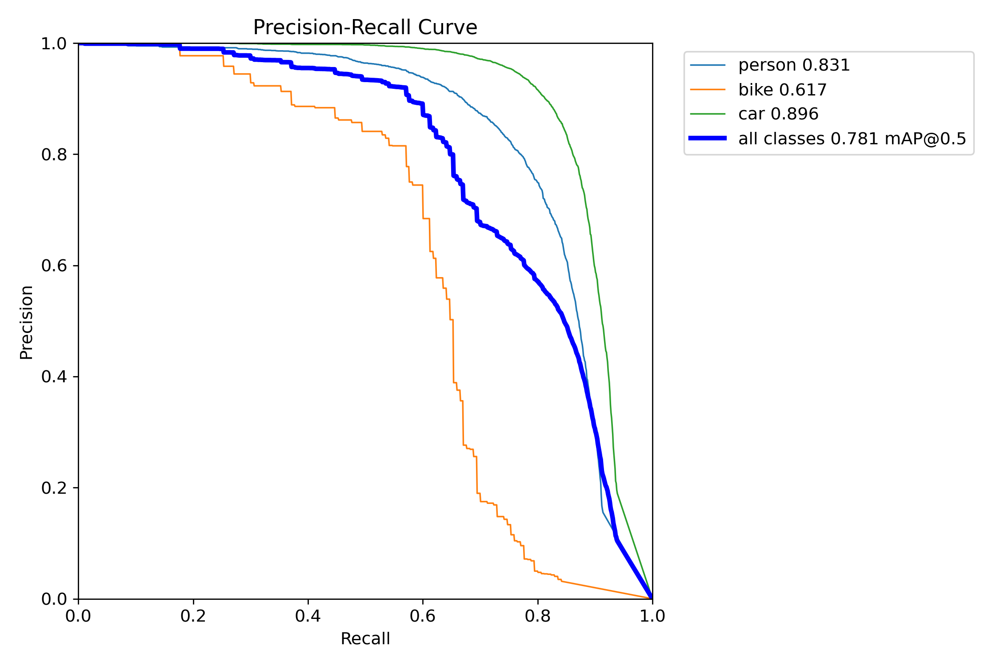

In [ ]:
Image(filename=f'PR_curve.png', width=400)


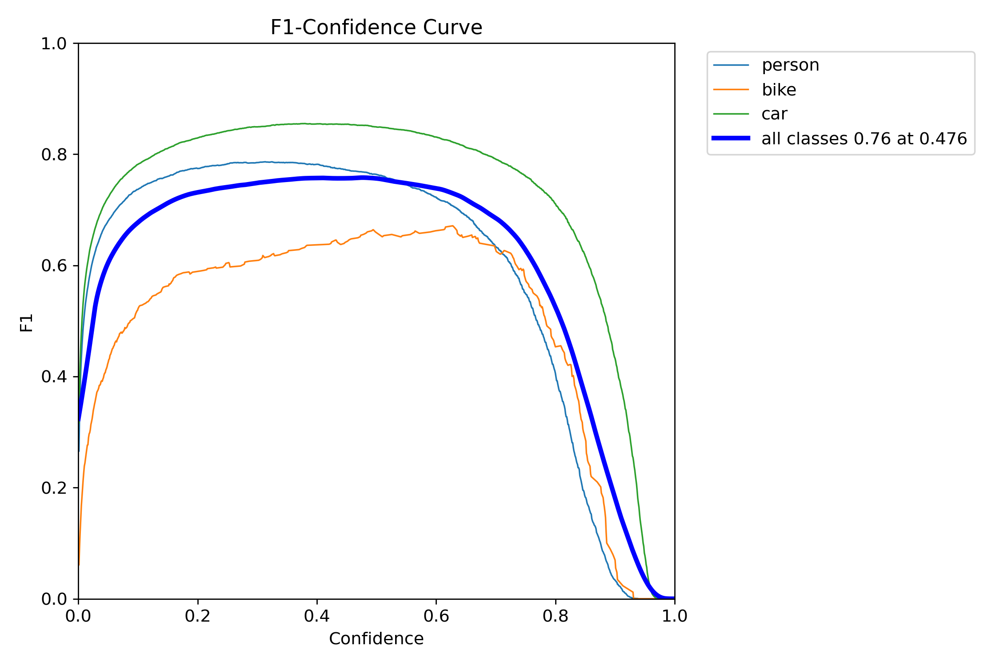

In [ ]:
Image(filename=f'F1_curve.png', width=400)

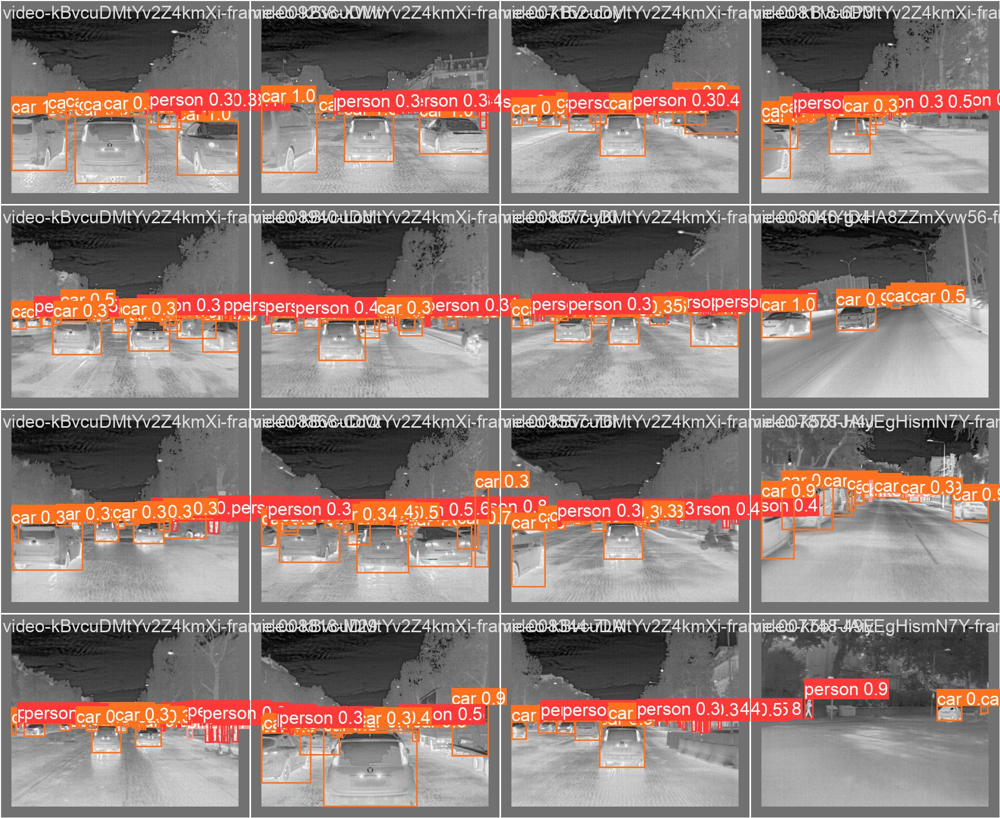

In [ ]:
Image(filename=f'val_batch2_pred.jpg', width=1000)

### Certainly some good performance- might have more potential if pre-trainied on coco for example and transfer-learned on the FLIR dataset.

# Vision Transformer
the last model of this example note book.
this is an example of training a RT-DETR
https://arxiv.org/abs/2304.08069
https://docs.ultralytics.com/models/rtdetr/
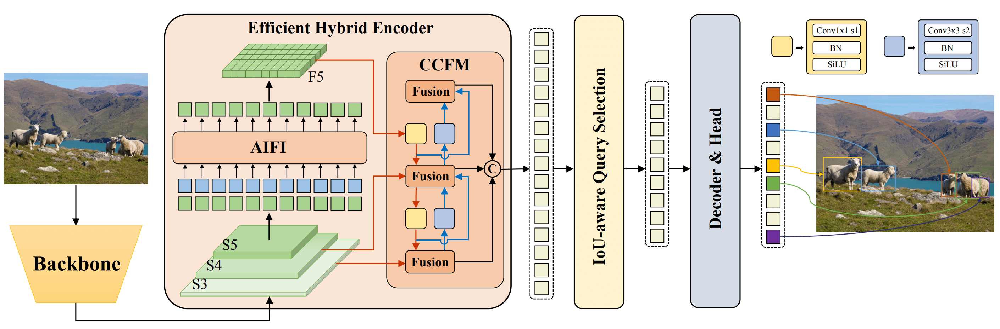

In [ ]:
from ultralytics import YOLO
from ultralytics import RTDETR

from IPython.display import display, Image


In [ ]:
%cd /gdrive/MyDrive/yolo/data
%ls

/gdrive/MyDrive/yolo/data
FLIR_rgb_yolov8.yaml  thermal1.yaml       thermal.yaml     yolov8-p6B.yaml
gdrive/               thermal2_aug1.yaml  YOLOv8/          yolov8-p6TR.yaml
rtdetr-x.pt           thermal2_rgb.yaml   yolov8l.pt       yolov8-p6.yaml
runs/                 thermal2.yaml       yolov8m.pt       yolov8s.pt
test_v8.yaml          thermal3.yaml       yolov8n.pt       yolov8x.pt
thermal/              thermal_test.yaml   yolov8-p6A.yaml


In [ ]:
model = RTDETR("rtdetr-x.pt")


In [ ]:
model.train(data='thermal2.yaml', epochs=100,patience=10,batch=32,lrf=0.001, dropout=0.1,mosaic=0.9,mixup=0.9)

Ultralytics YOLOv8.0.153 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=rtdetr-x.pt, data=thermal2.yaml, epochs=100, patience=10, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train82/
#%cd ..
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train82
args.yaml                                           results.csv
confusion_matrix_normalized.png                     results.png
confusion_matrix.png                                train_batch0.jpg
events.out.tfevents.1691848099.3c11db4e9b38.2195.0  train_batch1.jpg
events.out.tfevents.1691848376.3c11db4e9b38.2195.1  train_batch2.jpg
events.out.tfevents.1691848730.3c11db4e9b38.2195.2  val_batch0_labels.jpg
events.out.tfevents.1691854091.e486ae612cc2.1165.0  val_batch0_pred.jpg
F1_curve.png                                        val_batch1_labels.jpg
labels_correlogram.jpg                              val_batch1_pred.jpg
labels.jpg                                          val_batch2_labels.jpg
P_curve.png                                         val_batch2_pred.jpg
PR_curve.png                                        weights/
R_curve.png


In [ ]:
import pandas as pd
results =pd.read_csv('results.csv')
results


,epoch,train/giou_loss,train/cls_loss,train/l1_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/giou_loss,val/cls_loss,val/l1_loss,lr/pg0,lr/pg1,lr/pg2
0,0,1.28760,1.44430,0.35181,0.57527,0.56033,0.58043,0.32627,0.59396,0.61443,0.07033,0.003327,0.003327,0.003327
1,1,0.95947,0.50282,0.13989,0.71629,0.47240,0.54627,0.27539,0.71523,0.53970,0.08372,0.006594,0.006594,0.006594
2,2,1.06410,0.46202,0.15089,0.70581,0.53236,0.58024,0.30011,0.67427,0.51775,0.08593,0.009794,0.009794,0.009794
3,3,1.09740,0.45217,0.15473,0.68853,0.46852,0.54144,0.25974,0.71310,0.55377,0.09118,0.009700,0.009700,0.009700
4,4,1.02740,0.46856,0.13706,0.73442,0.50922,0.59054,0.29270,0.69685,0.53766,0.08716,0.009700,0.009700,0.009700
5,5,1.02000,0.47228,0.13501,0.73859,0.52674,0.61301,0.31330,0.63961,0.54795,0.07829,0.009600,0.009600,0.009600
6,6,0.98083,0.47976,0.12783,0.73952,0.54087,0.62583,0.33382,0.63386,0.55176,0.07974,0.009501,0.009501,0.009501
7,7,0.93397,0.48975,0.11834,0.75217,0.58574,0.66379,0.36681,0.57613,0.51745,0.07422,0.009401,0.009401,0.009401
8,8,0.92206,0.49105,0.11582,0.72774,0.54032,0.61273,0.31243,0.67132,0.50936,0.07996,0.009301,0.009301,0.009301
9,9,0.90425,0.49168,0.11130,0.77331,0.56814,0.64324,0.35844,0.61363,0.50254,0.07287,0.009201,0.009201,0.009201


Text(0.5, 0, 'epoch')

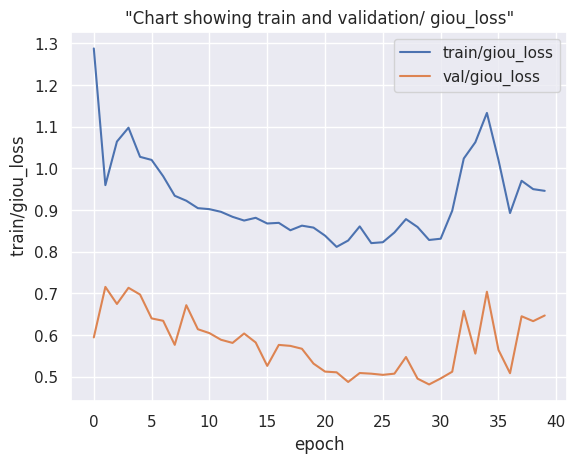

In [ ]:
import seaborn as sns
sns.lineplot( data=results['        train/giou_loss'],label='train/giou_loss')
sns.lineplot( data=results['          val/giou_loss'],label ='val/giou_loss')
plt.title('"Chart showing train and validation/ giou_loss"')
plt.legend()
plt.xlabel('epoch')



### training loss curves show some unsual activity.

Text(0.5, 0, 'epoch')

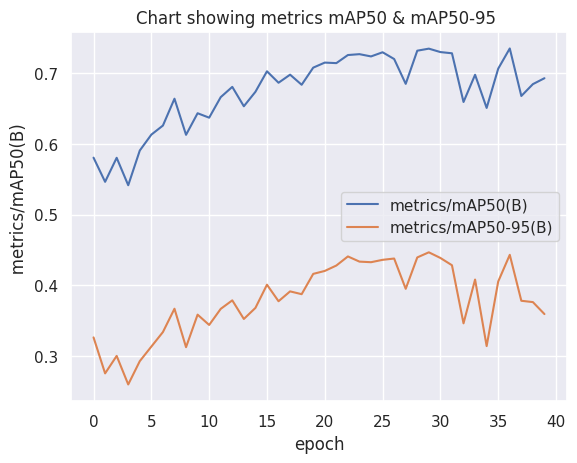

In [ ]:
sns.lineplot( data=results['       metrics/mAP50(B)'],label ='metrics/mAP50(B)')
sns.lineplot( data=results['    metrics/mAP50-95(B)'],label='metrics/mAP50-95(B)')
plt.title("Chart showing metrics mAP50 & mAP50-95 ")
plt.legend()
plt.xlabel('epoch')


Text(0.5, 0, 'epoch')

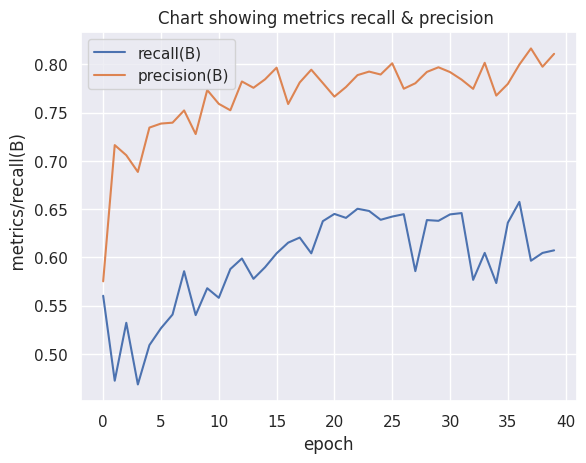

In [ ]:

sns.lineplot( data=results['      metrics/recall(B)'],label ='recall(B)')
sns.lineplot( data=results['   metrics/precision(B)'],label ='precision(B)')
plt.title("Chart showing metrics recall & precision ")
plt.legend()
plt.xlabel('epoch')


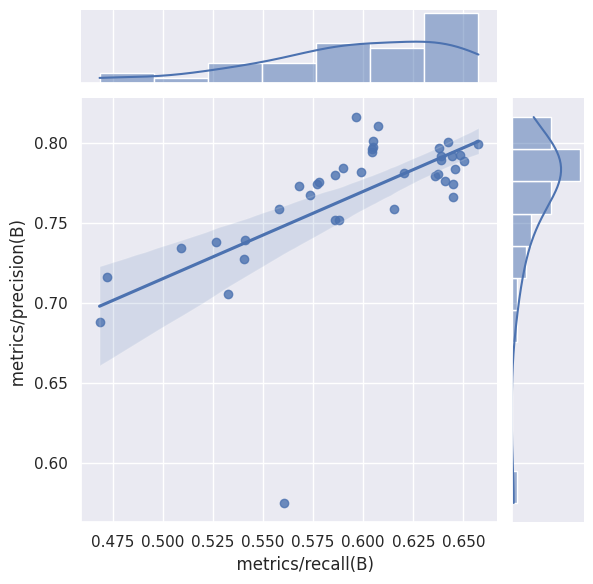

In [ ]:
sns.set_theme()

sns.jointplot(x="      metrics/recall(B)", y="   metrics/precision(B)", data=results, kind="reg");



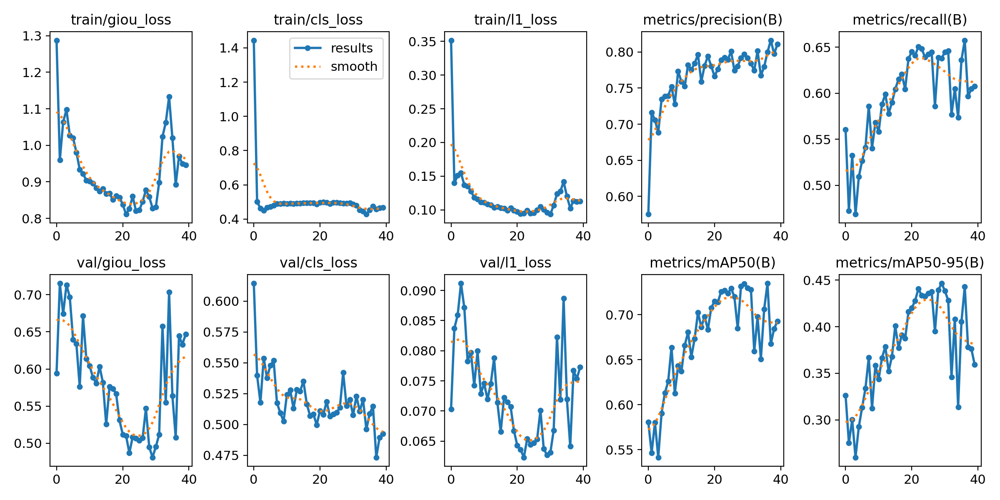

In [ ]:
Image(filename=f'results.png', width=1000)

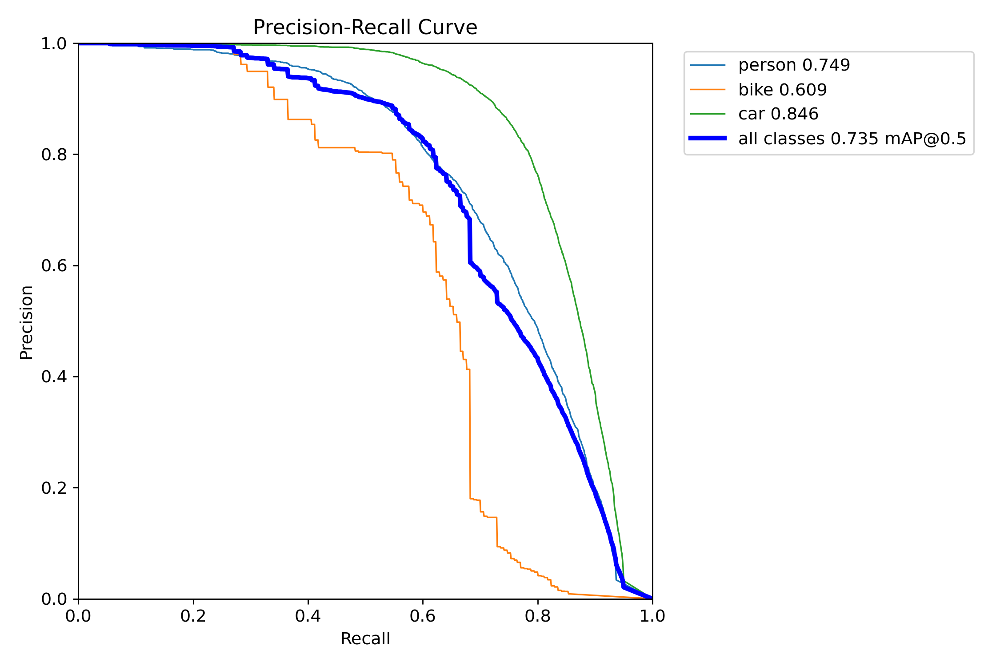

In [ ]:
Image(filename=f'PR_curve.png', width=400)


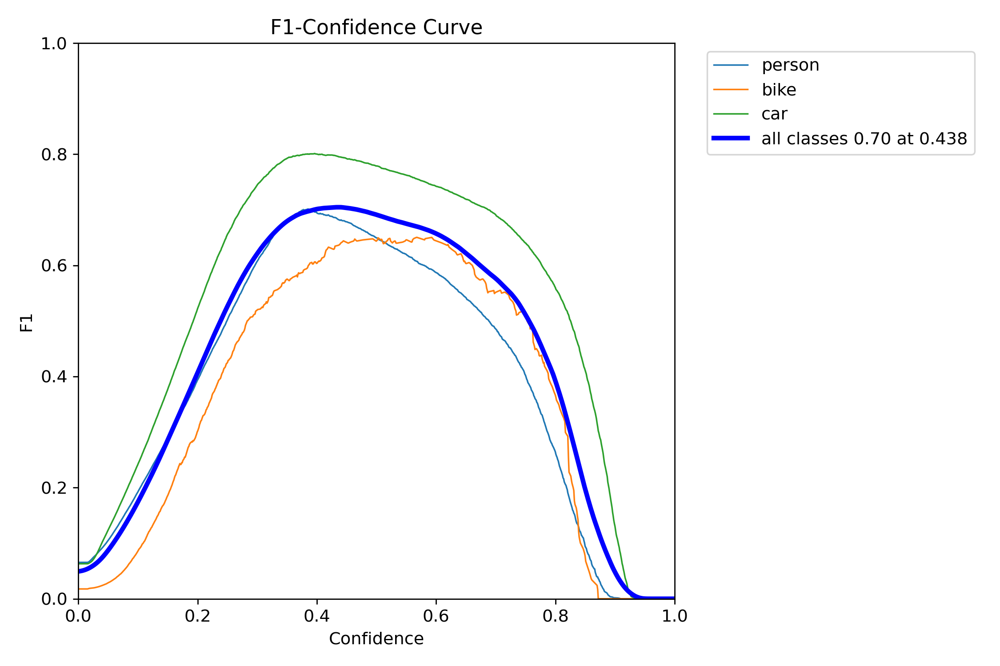

In [ ]:
Image(filename=f'F1_curve.png', width=400)

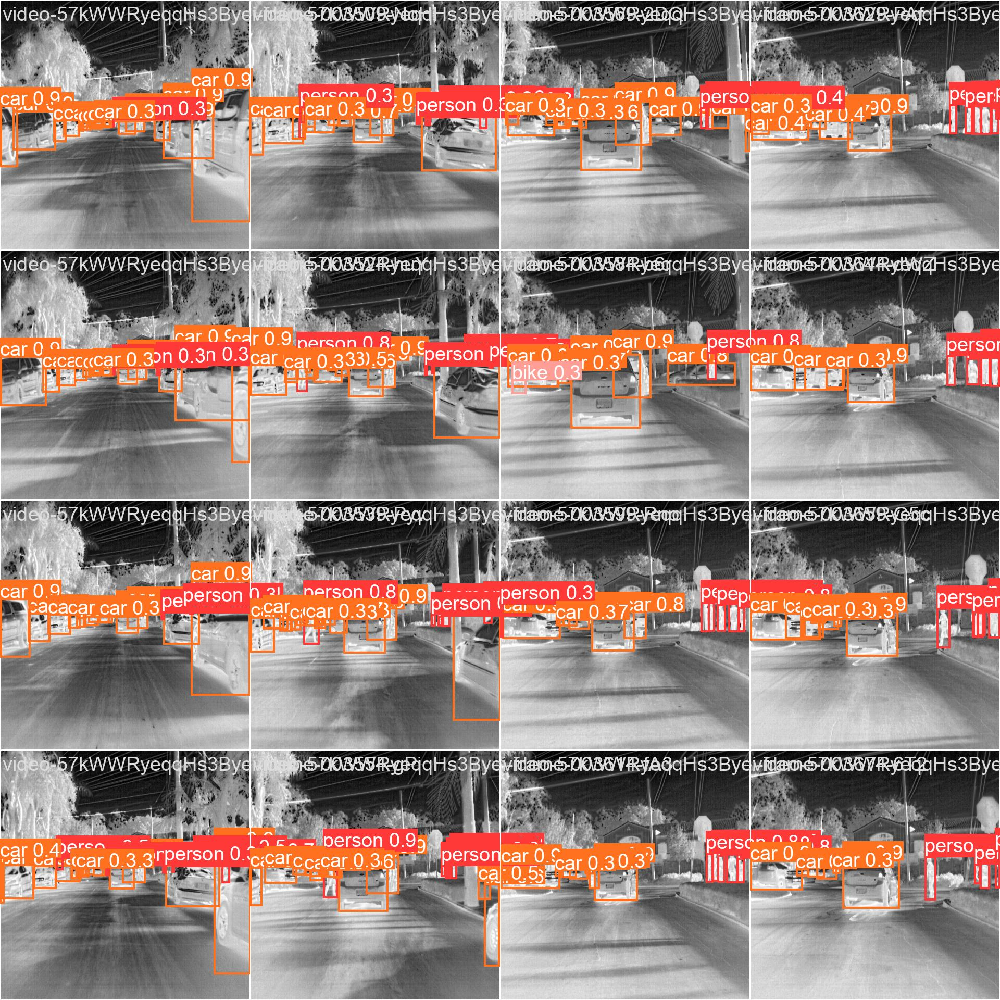

In [ ]:
Image(filename=f'val_batch1_pred.jpg', width=1000)

In [ ]:
%cd /gdrive/MyDrive/yolo/data/runs/detect/train82/weights/
%ls

/gdrive/MyDrive/yolo/data/runs/detect/train82/weights
best.pt  last.pt  runs/


The following output is test data not val( folders have been renamed)

In [ ]:
model = RTDETR("best.pt")


In [ ]:
results = model.val(data='/gdrive/MyDrive/yolo/data/thermal2.yaml')

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
rt-detr-x summary: 642 layers, 65490041 parameters, 0 gradients
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/val_thermal_images.cache... 1144 images, 48 backgrounds, 0 corrupt: 100%|██████████| 1144/1144 [00:00<?, ?it/s]
val: WARNING ⚠️ /gdrive/MyDrive/yolo/data/thermal/images/val_thermal_images/video-kBvcuDMtYv2Z4kmXi-frame-008818-M29zA3RYL5ud23Cp9.jpg: 5 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [01:16<00:00,  1.07s/it]
                   all       1144      11607      0.799      0.638      0.735      0.448
                person       1144       4309      0.845      0.579       0.75       0.42
                  bike       1144        170      0.652      0.618      0.609      0.351
                   car       1144       7128      0.899      0.717      0.847      0.572
Speed: 0.5ms preprocess,

In [ ]:
results = model.val(data='/gdrive/MyDrive/yolo/data/thermal_test.yaml')

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
rt-detr-x summary: 642 layers, 65490041 parameters, 0 gradients
val: Scanning /gdrive/MyDrive/yolo/data/thermal/labels/test_thermal_images.cache... 3749 images, 256 backgrounds, 0 corrupt: 100%|██████████| 3749/3749 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 235/235 [05:03<00:00,  1.29s/it]
                   all       3749      41872      0.559      0.424      0.509      0.297
                person       3749      11242       0.83      0.653      0.772       0.44
                  bike       3749        113          0          0   0.000558   0.000177
                   car       3749      30517      0.847       0.62      0.754      0.452
Speed: 0.2ms preprocess, 58.5ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val5


### Real-Time Transformer results look reasonable on the two main classes car and person.
Recall that this mode wa not transfer-learnd also.



---



# END- see document for further details.

references:
[1] modified from udacity computervison nano degree.
[2] to be added.